In [2]:
#importing the libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px


from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [3]:
#importing the Data
data = pd.read_excel('total.xlsx')

In [4]:
data.head()

,Point,Vg,Ccomp,gm,Rcomp,Rea,RL,C1,C2,L1,L2,RC1,RC2,RL1,RL2,fc,PhaseMargin,GainMargin,Vout_ss
0,9217.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.068,0.1275,2619,58.09,14.83,23.97
1,9218.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.068,0.1725,2619,58.09,14.83,23.97
2,9219.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.092,0.1275,2619,58.09,14.83,23.97
3,9220.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.092,0.1725,2619,58.09,14.83,23.97
4,9221.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0115,0.068,0.1275,2619,58.09,14.83,23.97


In [5]:
#Checking the shape of the data
data.shape

(73755, 19)

In [6]:
#Checking if there are any NULL values
data.isnull().sum()

Point          27
Vg              0
Ccomp           0
gm              0
Rcomp           0
Rea             0
RL              0
C1              0
C2              0
L1              0
L2              0
RC1             0
RC2             0
RL1             0
RL2             0
fc              0
PhaseMargin     0
GainMargin      0
Vout_ss         0
dtype: int64

In [7]:
data = data.drop([ 'Vout_ss'], axis = 1)

In [8]:
data.shape

(73755, 18)

In [9]:
data.isnull().sum()

Point          27
Vg              0
Ccomp           0
gm              0
Rcomp           0
Rea             0
RL              0
C1              0
C2              0
L1              0
L2              0
RC1             0
RC2             0
RL1             0
RL2             0
fc              0
PhaseMargin     0
GainMargin      0
dtype: int64

In [10]:
#Describe the DataSet
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Point,73728,NaN,NaN,NaN,6144.5,3547.26,1,3072.75,6144.5,9216.25,12290
Vg,73755,NaN,NaN,NaN,13.5,3.67426,9,9,13.5,18,18
Ccomp,73755,NaN,NaN,NaN,4.69875e-08,1.11372e-08,3.29e-08,3.995e-08,4.7e-08,5.4e-08,6.11e-08
gm,73755,NaN,NaN,NaN,-0.001,0.000237175,-0.0013,-0.0013,-0.001,-0.0007,-0.0007
Rcomp,73755,NaN,NaN,NaN,1000,237.129,700,850,1000,1150,1300
Rea,73755,NaN,NaN,NaN,1e+06,237129,700000,850000,1e+06,1.15e+06,1.3e+06
RL,73755,NaN,NaN,NaN,30.6662,13.4,16,16,24,48,48
C1,73755,NaN,NaN,NaN,1e-06,2.37129e-07,7e-07,8.5e-07,1e-06,1.15e-06,1.3e-06
C2,73755,NaN,NaN,NaN,1e-05,2.37129e-06,7e-06,8.5e-06,1e-05,1.15e-05,1.3e-05
L1,73755,NaN,NaN,NaN,4e-05,9.48516e-06,2.8e-05,3.4e-05,4e-05,4.6e-05,5.2e-05


In [11]:
#Complete Info about the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73755 entries, 0 to 73754
Data columns (total 18 columns):
Point          73728 non-null float64
Vg             73755 non-null float64
Ccomp          73755 non-null float64
gm             73755 non-null float64
Rcomp          73755 non-null int64
Rea            73755 non-null int64
RL             73755 non-null int64
C1             73755 non-null float64
C2             73755 non-null float64
L1             73755 non-null float64
L2             73755 non-null float64
RC1            73755 non-null float64
RC2            73755 non-null float64
RL1            73755 non-null float64
RL2            73755 non-null float64
fc             73755 non-null object
PhaseMargin    73755 non-null object
GainMargin     73755 non-null object
dtypes: float64(12), int64(3), object(3)
memory usage: 10.1+ MB


In [12]:
# Descriptive statistics of Gain and Phase Margin
data[["PhaseMargin","GainMargin"]].describe()

,PhaseMargin,GainMargin
count,73755,73755
unique,279,234
top,sim err,eval err
freq,4868,12289


# Univariate Analysis

In [13]:
#Attributes in data
data.columns

Index(['Point', 'Vg', 'Ccomp', 'gm', 'Rcomp', 'Rea', 'RL', 'C1', 'C2', 'L1',
       'L2', 'RC1', 'RC2', 'RL1', 'RL2', 'fc', 'PhaseMargin', 'GainMargin'],
      dtype='object')

In [14]:
#target Variables are
data['PhaseMargin'].head()

0    58.09
1    58.09
2    58.09
3    58.09
4    58.09
Name: PhaseMargin, dtype: object

In [15]:

data['PhaseMargin'].value_counts()

sim err    4868
39.32       512
39.81       512
60.82       512
52.06       512
           ... 
47.19         1
60.86         1
56.19         1
52.8          1
59.33         1
Name: PhaseMargin, Length: 279, dtype: int64

In [16]:
#Distribution of the GainMargin
data['GainMargin'].value_counts()


eval err    12289
sim err      4868
13.22         768
14.8          512
12.07         512
            ...  
5.244           1
7.614           1
1.925           1
14.55           1
21.76           1
Name: GainMargin, Length: 234, dtype: int64

In [17]:
#There are 4864 Error Values for the Gain Margin 
#We have to remove the Gain Margin values 
data = data[data.GainMargin != 'eval err']
data=data[data.GainMargin!='sim err']
data=data[data.PhaseMargin!='sim err']
data=data[data.fc!='sim err']
data=data.dropna()

In [18]:
#The Shape of the Data after removing the Error Values in GainMargin,Phase Margin and fc
data.shape

(56576, 18)

In [19]:
#The Gain Margin values
data['GainMargin'].value_counts()

13.220    768
11.870    512
18.200    512
14.800    512
13.610    512
         ... 
17.340    256
4.583     256
20.400    256
7.659     256
1.718     256
Name: GainMargin, Length: 212, dtype: int64

In [20]:
# Descriptive statistics of Gain Margin
data[["GainMargin"]].describe()

,GainMargin
count,56576.00
unique,212.00
top,13.22
freq,768.00


In [21]:
# Descriptive statistics of the Phase Margin
data[["PhaseMargin"]].describe()

,PhaseMargin
count,56576.0
unique,212.0
top,51.8
freq,512.0


In [22]:
# Descriptive statistics of the fc
data[["fc"]].describe()

,fc
count,56576
unique,213
top,3416
freq,512


In [23]:
#Checking the Data types of the data
data.dtypes

Point          float64
Vg             float64
Ccomp          float64
gm             float64
Rcomp            int64
Rea              int64
RL               int64
C1             float64
C2             float64
L1             float64
L2             float64
RC1            float64
RC2            float64
RL1            float64
RL2            float64
fc              object
PhaseMargin     object
GainMargin      object
dtype: object

In [24]:
data['GainMargin'].value_counts()

13.220    768
11.870    512
18.200    512
14.800    512
13.610    512
         ... 
17.340    256
4.583     256
20.400    256
7.659     256
1.718     256
Name: GainMargin, Length: 212, dtype: int64

In [25]:
#Distribution of the GainMargin 
fig = px.histogram(data, x="GainMargin")
fig.show()

In [26]:
#Distribution of the Phase Margin 
fig = px.histogram(data, x="PhaseMargin")
fig.show()

In [27]:
#Distribution of the fc
fig = px.histogram(data, x="fc", color= 'fc')
fig.show()

In [28]:
fig = px.box(data, y="RL2", title='Box Plot for Paramater RL2')
fig.show()

In [29]:
fig = px.box(data, y="RL1", title='Box Plot for Paramater RL1')
fig.show()

In [30]:
fig = px.box(data, y="RC1", title='Box Plot for Paramater RC1')
fig.show()

In [31]:
fig = px.box(data, y="RL2",color='RC2' ,title='Box Plot for Paramater RL2')
fig.show()

In [32]:
data['RC2'].value_counts()

0.0085    14464
0.0115    14464
0.0070    13824
0.0130    13824
Name: RC2, dtype: int64

In [33]:
#Pie chart for the categorical C1 variables 
temp = data["C1"].value_counts()
labels = temp.index
values = temp.values
trace = go.Pie(labels=labels, values=values)
iplot([trace], filename='basic_pie_chart')

In [34]:
#Pie chart for the categorical L1 variables 
temp1  = data["L1"].value_counts()
fig = {
  "data": [
    {
      "values": temp1.values,
      "labels": temp1.index,
      "domain": {"x": [0, .48]},
      "name": "Distribution of L1 Variables",
      "hoverinfo":"label+percent+name",
      "hole": .4,
      "type": "pie"
    }],
    
    "layout": {
            "title":"Distribution of L1 Variables",
            "annotations": [
                {
                    "font": {
                        "size": 20
                    },
                    "showarrow": False,
                    "text": "L1",
                    "x": 0.20,
                    "y": 0.5
                },
                  
        ]
    }
}
py.iplot(fig, filename='donut')



In [35]:
#Distribution of the RL Variable 
fig = px.box(data,color='RL', x="RL")
fig.show()

In [36]:
data['Rea'].value_counts()

1150000    14848
700000     14080
850000     14080
1300000    13568
Name: Rea, dtype: int64

In [37]:
#Distribution of the Rea Variable 
fig = px.histogram(data, x="Rea")
fig.show()

In [38]:
data['Rcomp'].value_counts()

850     14848
1150    14080
700     14080
1300    13568
Name: Rcomp, dtype: int64

In [39]:
#Pie chart for the categorical L1 variables 
temp1  = data["Rcomp"].value_counts()
fig = {
  "data": [
    {
      "values": temp1.values,
      "labels": temp1.index,
      "domain": {"x": [0, .48]},
      "name": "Distribution of Rcomp Variables",
      "hoverinfo":"label+percent+name",
      "hole": .4,
      "type": "pie"
    }],
    
    "layout": {
            "title":"Distribution of Rcomp Variables",
            "annotations": [
                {
                    "font": {
                        "size": 20
                    },
                    "showarrow": False,
                    "text": "Rcomp",
                    "x": 0.20,
                    "y": 0.5
                },
                  
        ]
    }
}
py.iplot(fig, filename='donut')



In [40]:
data['Vg'].value_counts()

9.0     21760
18.0    18944
13.5    15872
Name: Vg, dtype: int64

In [41]:
data['gm'].value_counts()

-0.00115    15360
-0.00130    14080
-0.00070    13568
-0.00085    13568
Name: gm, dtype: int64

In [42]:
#Pie chart for the categorical gm variables 
temp1  = data["gm"].value_counts()
fig = {
  "data": [
    {
      "values": temp1.values,
      "labels": temp1.index,
      "domain": {"x": [0, .48]},
      "name": "Distribution of gm Variables",
      "hoverinfo":"label+percent+name",
      "hole": .4,
      "type": "pie"
    }],
    
    "layout": {
            "title":"Distribution of gm Variables",
            "annotations": [
                {
                    "font": {
                        "size": 20
                    },
                    "showarrow": False,
                    "text": "gm",
                    "x": 0.20,
                    "y": 0.5
                },
                  
        ]
    }
}
py.iplot(fig, filename='basic_pie_chart')



In [43]:
#Distribution of the RL and Phase Margin Variable 
fig = px.box(data,color='RL', y="PhaseMargin")
fig.show()

In [44]:
#Distribution of the RL and  Gain Margin Variable 
fig = px.box(data,color='RL', y="GainMargin")
fig.show()

In [45]:
#Distribution of the RL and fc Variable 
fig = px.box(data,color='RL', y="fc")
fig.show()

In [46]:
 data.head()

,Point,Vg,Ccomp,gm,Rcomp,Rea,RL,C1,C2,L1,L2,RC1,RC2,RL1,RL2,fc,PhaseMargin,GainMargin
0,9217.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.068,0.1275,2619,58.09,14.83
1,9218.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.068,0.1725,2619,58.09,14.83
2,9219.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.092,0.1275,2619,58.09,14.83
3,9220.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0085,0.092,0.1725,2619,58.09,14.83
4,9221.0,13.5,5.400000e-08,-0.00085,850,850000,16,8.500000e-07,0.000008,0.000034,0.000085,0.0085,0.0115,0.068,0.1275,2619,58.09,14.83


# Heat Map

In [47]:
#  converting phase and gain margin to Float
data['PhaseMargin'] = data['PhaseMargin'].astype(float)
data['GainMargin'] = data['GainMargin'].astype(float)

In [48]:
# Descriptive statistics
data.describe()

,Point,Vg,Ccomp,gm,Rcomp,Rea,RL,C1,C2,L1,L2,RC1,RC2,RL1,RL2,PhaseMargin,GainMargin
count,56576.000000,56576.000000,5.657600e+04,56576.000000,56576.000000,5.657600e+04,56576.000000,5.657600e+04,56576.000000,56576.000000,56576.000000,56576.000000,56576.000000,56576.000000,56576.000000,56576.000000,56576.000000
mean,5918.037330,13.276018,4.657262e-08,-0.001007,995.248869,9.993213e+05,27.221719,1.000000e-06,0.000010,0.000040,0.000100,0.010000,0.010000,0.080000,0.150000,47.501041,12.749306
std,3469.879416,3.810393,1.105491e-08,0.000235,235.509729,2.355567e+05,12.425841,2.355576e-07,0.000002,0.000009,0.000024,0.002356,0.002356,0.018845,0.035334,11.130102,7.810853
min,1.000000,9.000000,3.290000e-08,-0.001300,700.000000,7.000000e+05,16.000000,7.000000e-07,0.000007,0.000028,0.000070,0.007000,0.007000,0.056000,0.105000,14.920000,-4.670000
25%,2838.000000,9.000000,3.290000e-08,-0.001150,850.000000,8.500000e+05,16.000000,8.500000e-07,0.000008,0.000034,0.000085,0.008500,0.008500,0.068000,0.127500,40.190000,7.659000
50%,5863.000000,13.500000,3.995000e-08,-0.001150,850.000000,1.150000e+06,24.000000,1.000000e-06,0.000010,0.000040,0.000100,0.010000,0.010000,0.080000,0.150000,48.920000,12.630000
75%,8864.250000,18.000000,5.400000e-08,-0.000850,1150.000000,1.150000e+06,32.000000,1.150000e-06,0.000012,0.000046,0.000115,0.011500,0.011500,0.092000,0.172500,54.540000,17.350000
max,12290.000000,18.000000,6.110000e-08,-0.000700,1300.000000,1.300000e+06,48.000000,1.300000e-06,0.000013,0.000052,0.000130,0.013000,0.013000,0.104000,0.195000,74.720000,69.310000


In [49]:
sns.set(style="whitegrid")

In [50]:
#Correlation of the Matrix 
corr =data.corr()
corr

,Point,Vg,Ccomp,gm,Rcomp,Rea,RL,C1,C2,L1,L2,RC1,RC2,RL1,RL2,PhaseMargin,GainMargin
Point,1.000000,-1.940975e-02,8.177917e-01,3.872646e-01,1.629396e-01,1.123764e-01,-2.402276e-02,1.748576e-02,8.743333e-03,4.371342e-03,2.185509e-03,1.092904e-03,5.469060e-04,2.949919e-04,1.366941e-04,7.415252e-01,8.291927e-02
Vg,-0.019410,1.000000e+00,-5.672706e-02,3.899154e-02,-1.480034e-02,4.066588e-02,-1.961556e-03,-3.596856e-16,1.623746e-16,1.213272e-16,-9.114753e-17,3.077622e-17,1.357242e-17,1.358267e-17,-8.147779e-18,3.435098e-01,7.240196e-01
Ccomp,0.817792,-5.672706e-02,1.000000e+00,-3.242816e-02,-3.932456e-02,3.110132e-02,-5.880953e-02,9.599622e-16,5.182161e-16,7.176176e-17,1.164517e-16,4.227663e-17,1.823887e-17,1.024675e-17,-3.428685e-17,6.479837e-01,-8.415846e-03
gm,0.387265,3.899154e-02,-3.242816e-02,1.000000e+00,-2.818212e-02,-3.129984e-02,-1.219456e-02,-7.356491e-16,-2.739805e-16,2.522440e-16,-1.344871e-16,-5.300835e-17,4.599951e-17,1.652156e-17,4.376953e-18,2.715877e-01,3.084700e-01
Rcomp,0.162940,-1.480034e-02,-3.932456e-02,-2.818212e-02,1.000000e+00,-2.391629e-02,-4.486794e-02,-5.421747e-16,2.720436e-16,3.254046e-16,7.223958e-17,9.316529e-17,-2.263382e-17,-4.301433e-18,-2.813288e-17,4.184899e-01,-3.114249e-01
Rea,0.112376,4.066588e-02,3.110132e-02,-3.129984e-02,-2.391629e-02,1.000000e+00,-1.594912e-02,-6.404954e-16,-4.577956e-16,5.494021e-17,9.470321e-17,4.868433e-17,1.321861e-17,5.910349e-18,-2.212711e-17,1.201786e-02,5.163603e-02
RL,-0.024023,-1.961556e-03,-5.880953e-02,-1.219456e-02,-4.486794e-02,-1.594912e-02,1.000000e+00,-3.857642e-16,-2.759782e-16,5.540454e-17,-6.648545e-17,-1.359745e-18,-1.662283e-17,1.877244e-18,-2.245541e-17,-1.783520e-01,1.131128e-01
C1,0.017486,-3.596856e-16,9.599622e-16,-7.356491e-16,-5.421747e-16,-6.404954e-16,-3.857642e-16,1.000000e+00,4.643584e-17,-6.674358e-17,-8.003826e-17,4.481155e-18,-1.118065e-17,0.000000e+00,0.000000e+00,-3.701305e-17,-9.827819e-18
C2,0.008743,1.623746e-16,5.182161e-16,-2.739805e-16,2.720436e-16,-4.577956e-16,-2.759782e-16,4.643584e-17,1.000000e+00,-2.013308e-17,6.525753e-19,1.904318e-17,9.541351e-18,9.528176e-18,-1.016339e-17,1.572005e-17,-3.062552e-17
L1,0.004371,1.213272e-16,7.176176e-17,2.522440e-16,3.254046e-16,5.494021e-17,5.540454e-17,-6.674358e-17,-2.013308e-17,1.000000e+00,-1.422923e-16,-2.898505e-20,4.782533e-18,0.000000e+00,1.016339e-17,2.070652e-17,-7.027368e-18


[Text(0.5, 0, 'Point'),
 Text(1.5, 0, 'Vg'),
 Text(2.5, 0, 'Ccomp'),
 Text(3.5, 0, 'gm'),
 Text(4.5, 0, 'Rcomp'),
 Text(5.5, 0, 'Rea'),
 Text(6.5, 0, 'RL'),
 Text(7.5, 0, 'C1'),
 Text(8.5, 0, 'C2'),
 Text(9.5, 0, 'L1'),
 Text(10.5, 0, 'L2'),
 Text(11.5, 0, 'RC1'),
 Text(12.5, 0, 'RC2'),
 Text(13.5, 0, 'RL1'),
 Text(14.5, 0, 'RL2'),
 Text(15.5, 0, 'PhaseMargin'),
 Text(16.5, 0, 'GainMargin')]

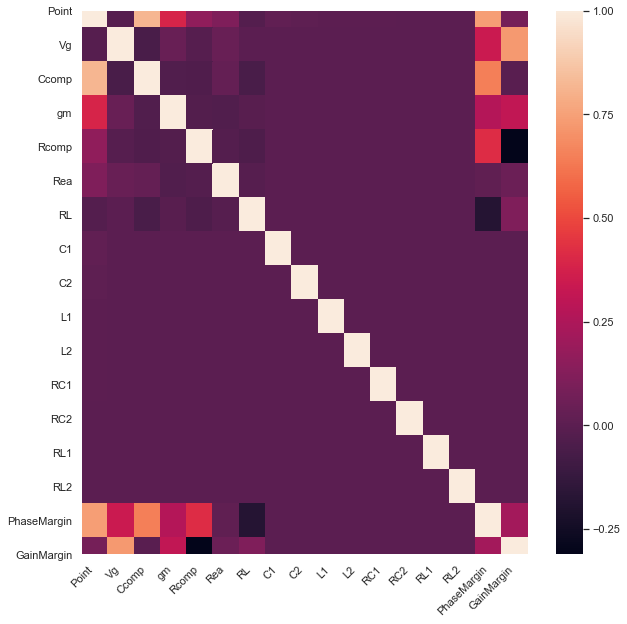

In [51]:
plt.figure(figsize = (10,10))
ax = sns.heatmap(
    corr
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

# Train Test Split

In [52]:
data.isna().sum()

Point          0
Vg             0
Ccomp          0
gm             0
Rcomp          0
Rea            0
RL             0
C1             0
C2             0
L1             0
L2             0
RC1            0
RC2            0
RL1            0
RL2            0
fc             0
PhaseMargin    0
GainMargin     0
dtype: int64

In [53]:
#Dividing the attributes and Target variables 
x = data.drop(['fc','PhaseMargin' ,'GainMargin'], axis = 1)
y = data[['fc','PhaseMargin' ,'GainMargin']].copy()

In [54]:
x.shape

(56576, 15)

In [55]:
y.shape

(56576, 3)

In [56]:
#Splitting data into training and test sets
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)
print (x_train.shape, y_train.shape)
print (x_test.shape, y_test.shape)

(45260, 15) (45260, 3)
(11316, 15) (11316, 3)


In [57]:
#Strandard Scaler 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

# Model Prediction

In [58]:
from sklearn.model_selection import cross_val_score,KFold
rf_model = RandomForestRegressor(n_estimators=100,max_depth=40,random_state=0,min_samples_split=5)
model = MultiOutputRegressor(estimator=rf_model)
kfold = KFold(n_splits=3, random_state=10)
score = cross_val_score(model, x_test, y_test, cv=kfold, scoring='r2')
score #Cross validation accuracy

array([0.99967375, 0.99962904, 0.99968918])

In [59]:
model.fit(x_train,y_train)#Fitting multi target regression(MTR)
model.score(x_test,y_test)#Finding accuracy

0.9999364575013017

In [60]:
rf_model.fit(x_train,y_train)#Fitting random forest model
rf_model.score(x_test,y_test)#Finding accuracy of random forest model

0.9999812321794784

In [61]:
y_mult = model.predict(x_test)#Predicting y values using MTR
y_rf = rf_model.predict(x_test)#Predicting y values using random forest
print('Mean Absolute Error:',metrics.mean_absolute_error(y_test,y_rf))
print('Mean Squared Error:',metrics.mean_squared_error(y_test,y_rf))
print('Root Mean Squared Error:',np.sqrt(metrics.mean_squared_error(y_test,y_rf)))

Mean Absolute Error: 0.04543749528694021
Mean Squared Error: 9.64117812473578
Root Mean Squared Error: 3.1050246576695297


In [62]:
# Gain Margin
# Print the feature importance
columns = x.columns
for feature in zip(columns, model.estimators_[0].feature_importances_):
    print(feature)

('Point', 0.03133910406242146)
('Vg', 0.4699175919374397)
('Ccomp', 0.06368305978261134)
('gm', 0.28615030227158855)
('Rcomp', 0.13466215732568626)
('Rea', 0.00027832871973906034)
('RL', 0.013969422930588051)
('C1', 7.1541535114679675e-09)
('C2', 8.002864086702994e-09)
('L1', 0.0)
('L2', 3.310875854454212e-10)
('RC1', 9.766621506104609e-09)
('RC2', 3.3156030208093344e-09)
('RL1', 0.0)
('RL2', 4.399595909367088e-09)


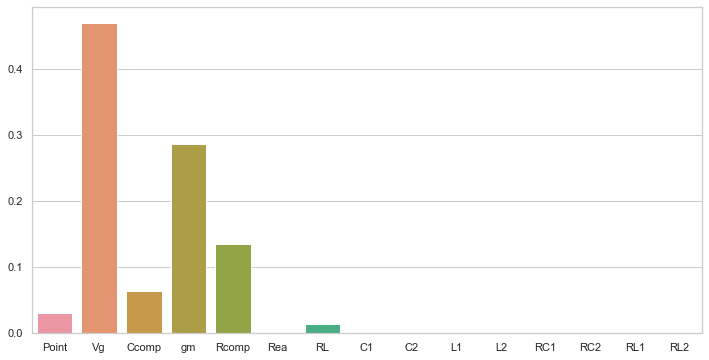

In [63]:
plt.figure(figsize = (12,6))
sns.barplot(x=columns,y=model.estimators_[0].feature_importances_)    

In [64]:
rf_model.fit(x_train,y_train)
rf_model.score(x_test,y_test)


0.9999812321794784

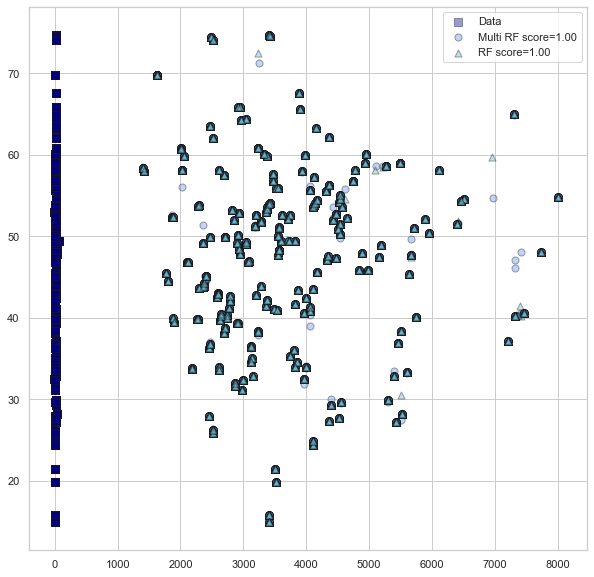

In [65]:
# Plot the results
plt.figure(figsize = (10,10))
s = 50
a = 0.4
plt.scatter(y["GainMargin"], y["PhaseMargin"], edgecolor='k',
            c="navy", s=s, marker="s", alpha=a, label="Data")

plt.scatter(y_mult[:, 0], y_mult[:, 1], edgecolor='k',
            c="cornflowerblue", s=s, alpha=a,
            label="Multi RF score=%.2f" % model.score(x_test, y_test))

plt.scatter(y_rf[:, 0], y_rf[:, 1], edgecolor='k',
            c="c", s=s, marker="^", alpha=a,
            label="RF score=%.2f" % rf_model.score(x_test, y_test))

plt.legend()

plt.show()

# XGBoost

In [66]:
import xgboost as xgb

xgmodel = xgb.XGBRegressor(
		learning_rate = 0.01,
		n_estimators = 1200,
		max_depth = 15,
		min_child_weight = 3,
		gamma = 0.1,
		reg_lambda = 10,
		subsample = 0.8,
		reg_alpha = 1,
		colsample_bytree = 0.8,
		objective = 'reg:squarederror',
		nthread = -1,
		silent = False,
		scale_pos_weight = 1)
model = MultiOutputRegressor(estimator=xgmodel)
kfold = KFold(n_splits=3, random_state=10)
score = cross_val_score(model, x_test, y_test, cv=kfold, scoring='r2')
score 

array([0.99974902, 0.99967132, 0.99916474])

In [67]:
model.fit(x_train,y_train)
model.score(x_test,y_test)

0.9999552968129679

('Point', 0.0026118122)
('Vg', 0.84739935)
('Ccomp', 0.0076018856)
('gm', 0.10588808)
('Rcomp', 0.03420339)
('Rea', 0.00013648054)
('RL', 0.0021588947)
('C1', 3.8475427e-08)
('C2', 1.9493513e-08)
('L1', 2.0622338e-08)
('L2', 1.6841222e-08)
('RC1', 2.4153866e-08)
('RC2', 3.040236e-08)
('RL1', 2.3682162e-08)
('RL2', 1.9286151e-08)


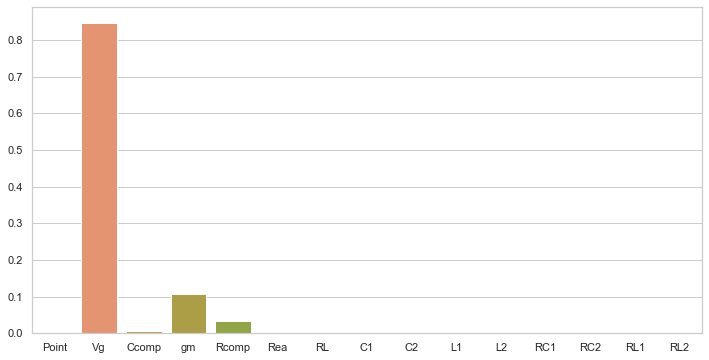

In [68]:
# Gain Margin
# Print the feature importance
plt.figure(figsize = (12,6))

for feature in zip(columns, model.estimators_[0].feature_importances_):
    print(feature)
sns.barplot(x=columns,y=model.estimators_[0].feature_importances_)   

('Point', 0.1778646)
('Vg', 0.29632124)
('Ccomp', 0.13966975)
('gm', 0.056021485)
('Rcomp', 0.29716092)
('Rea', 0.004336331)
('RL', 0.028218089)
('C1', 2.6290483e-05)
('C2', 6.9090755e-05)
('L1', 2.8454711e-05)
('L2', 5.1623472e-05)
('RC1', 5.271865e-05)
('RC2', 6.9782116e-05)
('RL1', 9.025667e-05)
('RL2', 1.93377e-05)


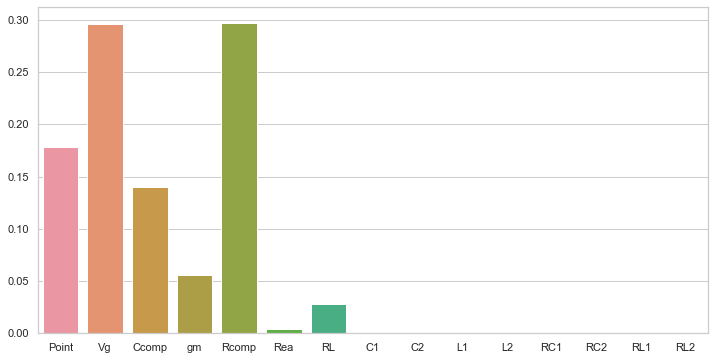

In [69]:
# Print the feature importance
plt.figure(figsize = (12,6))

for feature in zip(columns, model.estimators_[1].feature_importances_):
    print(feature)
sns.barplot(x=columns,y=model.estimators_[1].feature_importances_)

# ML Regressor

In [70]:
y_multirf = model.predict(x_test)
y_rf=rf_model.predict(x_test)

In [71]:
from sklearn.neural_network import MLPRegressor   

model = MLPRegressor(solver='lbfgs',alpha=0.001,hidden_layer_sizes=(150,))
model.fit(x_train,y_train)
model.score(x_test,y_test)

0.9955980161658545

# Artifical Neural Networks

In [72]:
from keras.models import Sequential
from keras.layers import *

model = Sequential()
model.add(Dense(4, input_dim =15,  activation='relu',kernel_initializer="normal"))
model.add(Dense(4, activation='relu',kernel_initializer="normal"))
model.add(Dense(3, activation='linear',kernel_initializer="normal"))
model.compile(loss='mean_squared_error', optimizer='adam',metrics=["accuracy"])

model.fit(x_train, y_train, epochs=100, batch_size=100)
score = model.evaluate(x_test, y_test, batch_size=100)
print(score)

Using TensorFlow backend.


Epoch 1/100
45260/45260 [==============================] - 1s 19us/step - loss: 4949179.5834 - accuracy: 1.0000
Epoch 2/100
45260/45260 [==============================] - 1s 13us/step - loss: 4795802.4765 - accuracy: 1.0000
Epoch 3/100
45260/45260 [==============================] - 1s 14us/step - loss: 4318484.3014 - accuracy: 1.0000
Epoch 4/100
45260/45260 [==============================] - 1s 13us/step - loss: 3506609.9338 - accuracy: 1.0000
Epoch 5/100
45260/45260 [==============================] - 1s 16us/step - loss: 2523023.5705 - accuracy: 1.0000
Epoch 6/100
45260/45260 [==============================] - 1s 13us/step - loss: 1615861.8174 - accuracy: 1.0000
Epoch 7/100
45260/45260 [==============================] - 1s 11us/step - loss: 978016.4130 - accuracy: 1.0000
Epoch 8/100
45260/45260 [==============================] - 1s 12us/step - loss: 627394.4402 - accuracy: 1.0000
Epoch 9/100
45260/45260 [==============================] - 1s 11us/step - loss: 447313.1958 - accuracy: 1.

In [73]:
ypred_ann=model.predict(x_test)

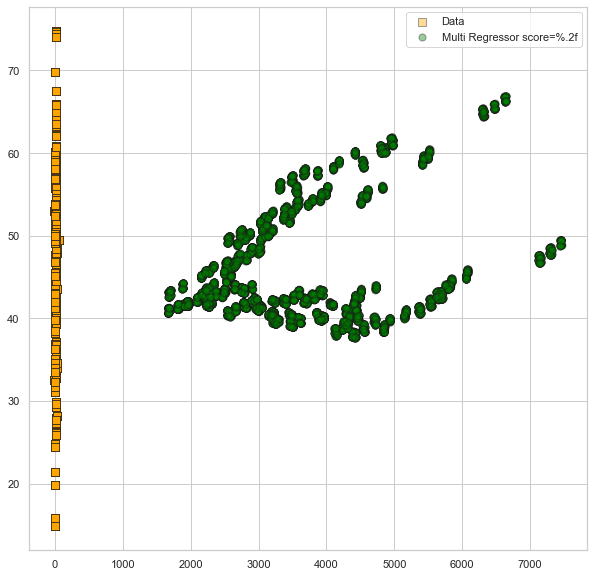

In [74]:
plt.figure(figsize=(10,10))
s = 50
a = 0.4
plt.scatter(y["GainMargin"], y["PhaseMargin"], edgecolor='k',
            c="orange", s=s, marker="s", alpha=a, label="Data")

plt.scatter(ypred_ann[:, 0], ypred_ann[:, 1], edgecolor='k',
            c="green", s=s, alpha=a,
            label="Multi Regressor score=%.2f")

plt.legend()
plt.show()

In [75]:
lm=LinearRegression()#Linear Regression model
lm.fit(x_train,y_train)
lscore=lm.score(x_test,y_test)
print(lscore)



0.9275851229272912


('Point', 15.60990203343481)
('Vg', 865.3870022207988)
('Ccomp', -333.9133110808064)
('gm', -696.070110431354)
('Rcomp', 350.50948293644655)
('Rea', -1.2299013922204391)
('RL', 128.47268881180392)
('C1', 0.9916992386913996)
('C2', -1.5535960738254186)
('L1', 1.2368621781342362)
('L2', 0.666152308712399)
('RC1', 0.7764734855032789)
('RC2', -0.18004756622617651)
('RL1', -0.6332920897587071)
('RL2', 0.5718590637158191)


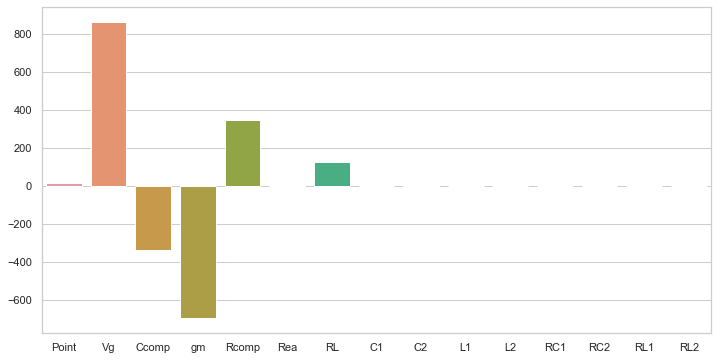

In [76]:
#Gain Margin
#Print feature importance

plt.figure(figsize = (12,6))
for feature in zip(columns, lm.coef_[0]):
    print(feature)
sns.barplot(x=columns,y=lm.coef_[0])

('Point', -0.4575625153091012)
('Vg', 4.206375315289976)
('Ccomp', 8.060919828225902)
('gm', 3.4227370384423264)
('Rcomp', 5.1558678890355765)
('Rea', -0.021247336714622735)
('RL', -1.2467756599593147)
('C1', 0.01151997830176367)
('C2', 0.01814010398496566)
('L1', -0.01094575003683608)
('L2', 0.005259701609324865)
('RC1', 0.00246392468071444)
('RC2', 0.00829546335417944)
('RL1', 0.006276540044228216)
('RL2', -0.014744927162688416)


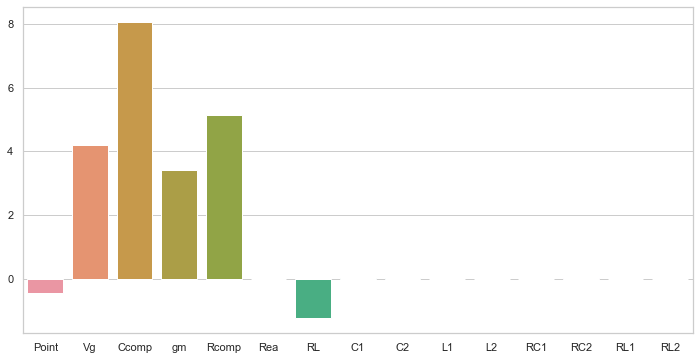

In [77]:
#Phase Margin
#Print feature importance
plt.figure(figsize = (12,6))
for feature in zip(columns, lm.coef_[1]):
    print(feature)
sns.barplot(x=columns,y=lm.coef_[1])

('Point', 0.5953371487678453)
('Vg', 5.54402616384242)
('Ccomp', -0.23017386327059744)
('gm', 1.8942165843376013)
('Rcomp', -2.3631414915606195)
('Rea', 0.12624308778437215)
('RL', 0.8217178700597725)
('C1', -0.007960551646852736)
('C2', -0.011884812959893399)
('L1', -0.010432236949243985)
('L2', 0.003005074380115335)
('RC1', 0.0049551472858825754)
('RC2', 0.005282662833253981)
('RL1', -0.00024556583720735644)
('RL2', -0.010074831905722415)


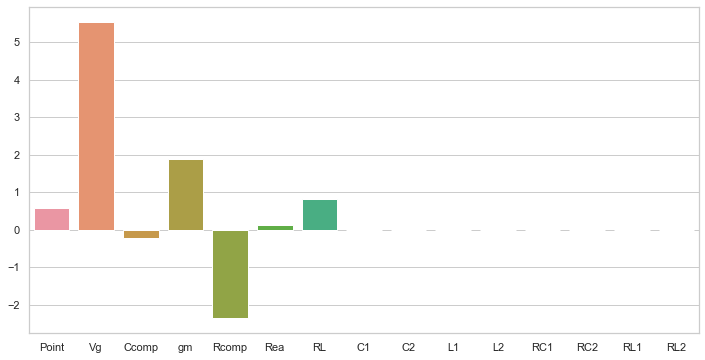

In [78]:
#fc
plt.figure(figsize = (12,6))
for feature in zip(columns, lm.coef_[2]):
    print(feature)
sns.barplot(x=columns,y=lm.coef_[2])

In [79]:
Ximp=data[['Vg','gm','Rcomp','RL','Point','Ccomp']]#Most important features

In [80]:
Ximp_train,Ximp_test,y_train,y_test=train_test_split(Ximp,y,test_size=0.2)#Split data into train and test sets
print (Ximp_train.shape, y_train.shape)
print (Ximp_test.shape, y_test.shape)

(45260, 6) (45260, 3)
(11316, 6) (11316, 3)


In [81]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
Ximp_train = sc.fit_transform(Ximp_train)
Ximp_test = sc.transform(Ximp_test)

In [82]:
limp=LinearRegression()
limp.fit(Ximp_train,y_train)
limpscore=limp.score(Ximp_test,y_test)
print(limpscore)
#Thus able to reduce the model from 15 to 6 features without losing much accuracy

0.9261290676342782


In [83]:
y_pred=limp.predict(Ximp_test)

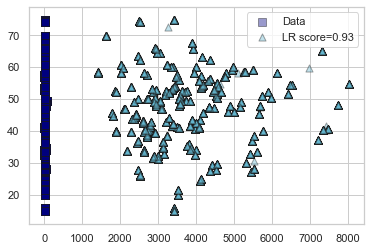

In [84]:
# Plot the results
plt.figure()
s = 50
a = 0.4
plt.scatter(y["GainMargin"], y["PhaseMargin"], edgecolor='k',
            c="navy", s=s, marker="s", alpha=a, label="Data")


plt.scatter(y_rf[:, 0], y_rf[:, 1], edgecolor='k',
            c="c", s=s, marker="^", alpha=a,
            label="LR score=%.2f" %limp.score(Ximp_test, y_test))

plt.legend()
plt.show()

In [85]:
from keras.models import Sequential#ANN model with selected features
from keras.layers import *

model = Sequential()
model.add(Dense(4, input_dim =6,  activation='relu',kernel_initializer="normal"))
model.add(Dense(4, activation='relu',kernel_initializer="normal"))
model.add(Dense(3, activation='linear',kernel_initializer="normal"))
model.compile(loss='mean_squared_error', optimizer='adam',metrics=["accuracy"])

model.fit(Ximp_train, y_train, epochs=100, batch_size=100)
score = model.evaluate(Ximp_test, y_test, batch_size=100)
print(score)

Epoch 1/100
45260/45260 [==============================] - 1s 15us/step - loss: 4941955.9160 - accuracy: 0.9941
Epoch 2/100
45260/45260 [==============================] - 0s 10us/step - loss: 4906090.3165 - accuracy: 1.0000
Epoch 3/100
45260/45260 [==============================] - 1s 13us/step - loss: 4793489.1258 - accuracy: 1.0000
Epoch 4/100
45260/45260 [==============================] - 1s 13us/step - loss: 4580119.8279 - accuracy: 1.0000
Epoch 5/100
45260/45260 [==============================] - 1s 12us/step - loss: 4261930.3048 - accuracy: 1.0000
Epoch 6/100
45260/45260 [==============================] - 1s 12us/step - loss: 3851374.7278 - accuracy: 1.0000
Epoch 7/100
45260/45260 [==============================] - 1s 13us/step - loss: 3373349.9908 - accuracy: 1.0000
Epoch 8/100
45260/45260 [==============================] - 1s 13us/step - loss: 2861481.7359 - accuracy: 1.0000
Epoch 9/100
45260/45260 [==============================] - 1s 12us/step - loss: 2352851.5814 - accuracy:

In [86]:
ypredimp_ann=model.predict(Ximp_test)

In [87]:
from sklearn.neural_network import MLPRegressor   #Multi layer perceptron model with selected features

model = MLPRegressor(solver='lbfgs',alpha=0.001,hidden_layer_sizes=(150,))
model.fit(Ximp_train,y_train)
model.score(Ximp_test,y_test)
#Successfully preserved accuracy while reducing model input features from 15 to 6

0.998725454479018

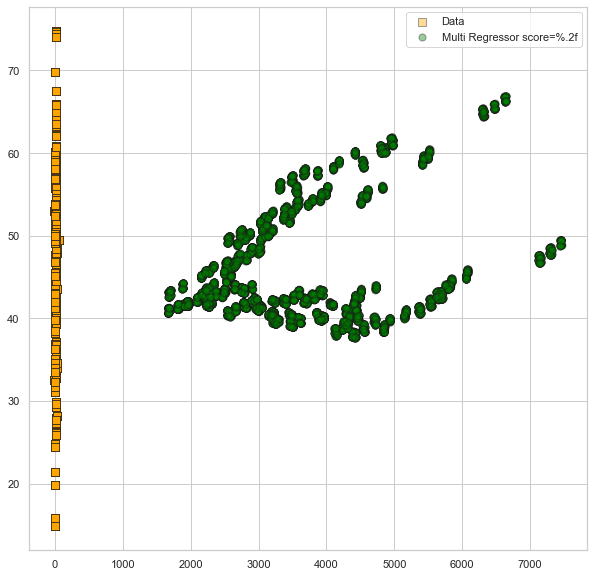

In [88]:
plt.figure(figsize=(10,10))
s = 50
a = 0.4
plt.scatter(y["GainMargin"], y["PhaseMargin"], edgecolor='k',
            c="orange", s=s, marker="s", alpha=a, label="Data")

plt.scatter(ypred_ann[:, 0], ypred_ann[:, 1], edgecolor='k',
            c="green", s=s, alpha=a,
            label="Multi Regressor score=%.2f")

plt.legend()
plt.show()

In [89]:
#Multi Target regression with selected features
rf_modelimp = RandomForestRegressor(n_estimators=100,max_depth=40,random_state=0,min_samples_split=5)
modelimp = MultiOutputRegressor(estimator=rf_model)
kfold = KFold(n_splits=3, random_state=10)
score = cross_val_score(modelimp, Ximp_test, y_test, cv=kfold, scoring='r2')
score #Cross validation accuracy

array([0.99975971, 0.99991604, 0.99976714])

In [90]:
modelimp.fit(Ximp_train,y_train)#Fitting multi target regression(MTR)
modelimp.score(Ximp_test,y_test)#Finding accuracy

0.9999680334682278

In [91]:
rf_modelimp.fit(Ximp_train,y_train)#Fitting random forest model
rf_modelimp.score(Ximp_test,y_test)#Finding accuracy of random forest model

0.9999978464103687

In [92]:
y_mult = modelimp.predict(Ximp_test)#Predicting y values using MTR
y_rf = rf_modelimp.predict(Ximp_test)#Predicting y values using random forest
print('Mean Absolute Error:',metrics.mean_absolute_error(y_test,y_rf))
print('Mean Squared Error:',metrics.mean_squared_error(y_test,y_rf))
print('Root Mean Squared Error:',np.sqrt(metrics.mean_squared_error(y_test,y_rf)))

Mean Absolute Error: 0.013663432308266702
Mean Squared Error: 1.1305896093713919
Root Mean Squared Error: 1.0632918740267847


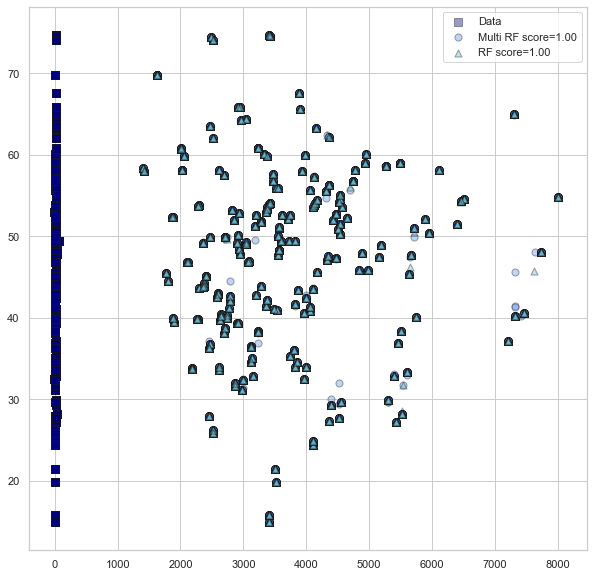

In [93]:
# Plot the results
plt.figure(figsize = (10,10))
s = 50
a = 0.4
plt.scatter(y["GainMargin"], y["PhaseMargin"], edgecolor='k',
            c="navy", s=s, marker="s", alpha=a, label="Data")

plt.scatter(y_mult[:, 0], y_mult[:, 1], edgecolor='k',
            c="cornflowerblue", s=s, alpha=a,
            label="Multi RF score=%.2f" % modelimp.score(Ximp_test, y_test))

plt.scatter(y_rf[:, 0], y_rf[:, 1], edgecolor='k',
            c="c", s=s, marker="^", alpha=a,
            label="RF score=%.2f" % rf_modelimp.score(Ximp_test, y_test))

plt.legend()

plt.show()

In [94]:

#XGBoost with important features
xgmodelimp = xgb.XGBRegressor(
		learning_rate = 0.01,
		n_estimators = 1200,
		max_depth = 15,
		min_child_weight = 3,
		gamma = 0.1,
		reg_lambda = 10,
		subsample = 0.8,
		reg_alpha = 1,
		colsample_bytree = 0.8,
		objective = 'reg:squarederror',
		nthread = -1,
		silent = False,
		scale_pos_weight = 1)
modelmimp = MultiOutputRegressor(estimator=xgmodelimp)
kfold = KFold(n_splits=3, random_state=10)
score = cross_val_score(modelmimp, Ximp_test, y_test, cv=kfold, scoring='r2')
score 

array([0.99968815, 0.99970666, 0.99932283])

In [95]:
modelmimp.fit(Ximp_train,y_train)
modelmimp.score(Ximp_test,y_test)

0.9999017445964172

('Vg', 0.91967326)
('gm', 0.037291203)
('Rcomp', 0.018830566)
('RL', 0.0026031588)
('Point', 0.0029909532)
('Ccomp', 0.018610846)


<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

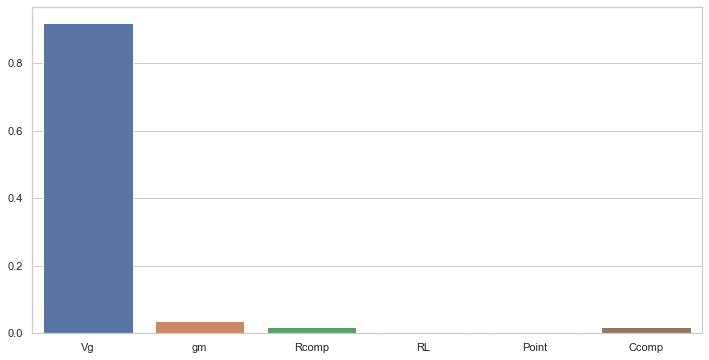

In [97]:
# Gain Margin
# Print the feature importance
columnsimp = Ximp.columns
for feature in zip(columnsimp, modelmimp.estimators_[0].feature_importances_):
    print(feature)
    plt.figure(figsize = (12,6))
sns.barplot(x=columnsimp,y=modelmimp.estimators_[0].feature_importances_)   

('Vg', 0.3343129)
('gm', 0.046017785)
('Rcomp', 0.119042836)
('RL', 0.025210751)
('Point', 0.088233404)
('Ccomp', 0.38718233)


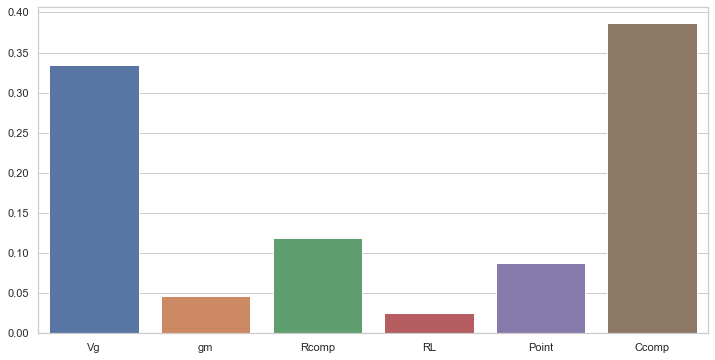

In [98]:
#Phase Margin
# Print the feature importance
plt.figure(figsize = (12,6))

for feature in zip(columnsimp, modelmimp.estimators_[1].feature_importances_):
    print(feature)
sns.barplot(x=columnsimp,y=modelmimp.estimators_[1].feature_importances_)

('Vg', 0.88286275)
('gm', 0.025493696)
('Rcomp', 0.027593035)
('RL', 0.048886284)
('Point', 0.006771574)
('Ccomp', 0.008392675)


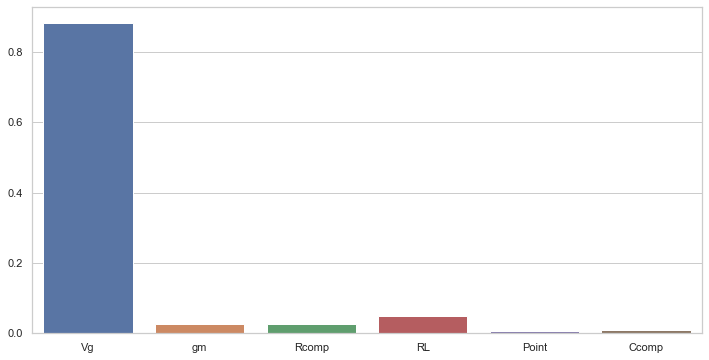

In [99]:
#fc
# Print the feature importance
plt.figure(figsize = (12,6))

for feature in zip(columnsimp, modelmimp.estimators_[2].feature_importances_):
    print(feature)
sns.barplot(x=columnsimp,y=modelmimp.estimators_[2].feature_importances_)